<a href="https://colab.research.google.com/github/edsonmy/alurastorebr/blob/main/AluraStoreBr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importação dos dados



In [1]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


## Parâmetros

In [2]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
import numpy as np
import folium

color = ['lightblue', 'lightgreen', 'orange', 'lightgray']

In [3]:
# Criar df clone para iniciar a análise
df_clone = loja[:]
df_clone['Data da Compra'] = pd.to_datetime(df_clone['Data da Compra'], format="%d/%m/%Y")
df_clone['Estabelecimento'] = 'Loja 1'

df_clone2 = loja2[:]
df_clone2['Data da Compra'] = pd.to_datetime(df_clone2['Data da Compra'], format="%d/%m/%Y")
df_clone2['Estabelecimento'] = 'Loja 2'

df_clone3 = loja3[:]
df_clone3['Data da Compra'] = pd.to_datetime(df_clone3['Data da Compra'], format="%d/%m/%Y")
df_clone3['Estabelecimento'] = 'Loja 3'

df_clone4 = loja4[:]
df_clone4['Data da Compra'] = pd.to_datetime(df_clone4['Data da Compra'], format="%d/%m/%Y")
df_clone4['Estabelecimento'] = 'Loja 4'


#1. Análise do faturamento


In [4]:
# Criar df com dados de todas as tabelas para análise do faturamento
faturamento = df_clone[['Estabelecimento', 'Preço']]
faturamento2 = df_clone2[['Estabelecimento', 'Preço']]
faturamento3 = df_clone3[['Estabelecimento', 'Preço']]
faturamento4 = df_clone4[['Estabelecimento', 'Preço']]
df_faturamentos = pd.concat([faturamento, faturamento2, faturamento3, faturamento4])
df_faturamento = df_faturamentos.groupby(['Estabelecimento'])['Preço'].sum().reset_index()
df_faturamento


,Estabelecimento,Preço
0,Loja 1,1534509.12
1,Loja 2,1488459.06
2,Loja 3,1464025.03
3,Loja 4,1384497.58


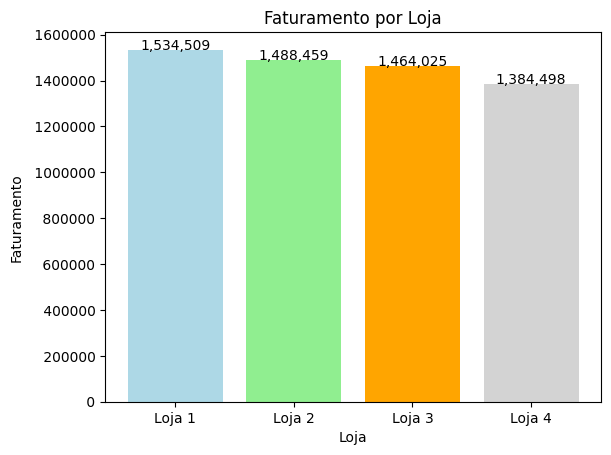

In [5]:
# Gráfico comparativo de faturamento por loja
estabelecimento = df_faturamento['Estabelecimento']
fig, ax = plt.subplots()
ax.yaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.bar(estabelecimento, df_faturamento['Preço'], color=color)
ax.set_xlabel('Loja')
ax.set_ylabel('Faturamento')
ax.set_title('Faturamento por Loja')
for i, value in enumerate(df_faturamento['Preço']):
    ax.text(i, value + 5, str("{:,.0f}").format(value), ha='center')

plt.show()

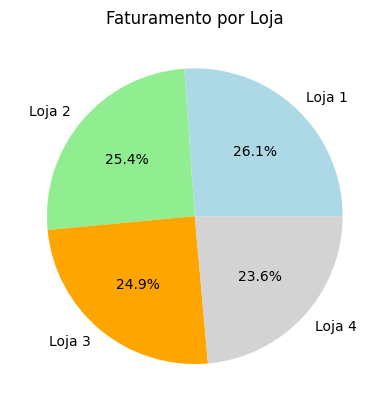

In [6]:
# Gráfico comparativo de faturamento por loja
estabelecimento = df_faturamento['Estabelecimento']
preco = df_faturamento['Preço']
fig, ax = plt.subplots()
ax.pie(preco, labels=estabelecimento, colors=color, autopct='%1.1f%%')
ax.set_title('Faturamento por Loja')

plt.show()

In [7]:
#
# Pelos gráficos a loja 4 teve o menor faturamento
#

# 2. Vendas por Categoria


In [8]:
# Criar df somente com dados de categoria do produto e preço
v_categoria = df_clone[['Categoria do Produto', 'Preço']]
v_categoria2 = df_clone2[['Categoria do Produto', 'Preço']]
v_categoria3 = df_clone3[['Categoria do Produto', 'Preço']]
v_categoria4 = df_clone4[['Categoria do Produto', 'Preço']]


In [9]:
# Análise de vendas por categoria para Loja 1
df_categoria = v_categoria.groupby(['Categoria do Produto'])['Preço'].sum().reset_index()
df_categoria = df_categoria.sort_values('Preço', ascending=True)
df_categoria

,Categoria do Produto,Preço
5,livros,11713.92
7,utilidades domesticas,16931.48
0,brinquedos,23993.78
3,esporte e lazer,52387.55
4,instrumentos musicais,121731.69
6,moveis,250178.11
1,eletrodomesticos,484913.36
2,eletronicos,572659.23


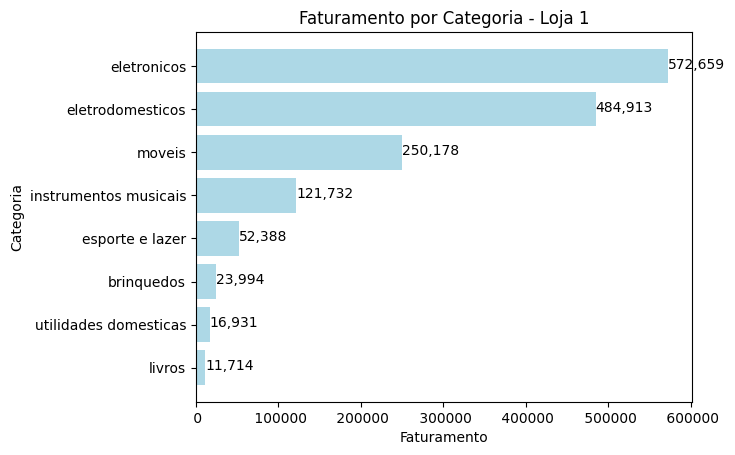

In [10]:
# Gráfico de vendas por categoria
categoria = df_categoria['Categoria do Produto']
preco = df_categoria['Preço']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(categoria, preco, color=color[0])
ax.set_ylabel('Categoria')
ax.set_xlabel('Faturamento')
ax.set_title('Faturamento por Categoria - Loja 1')
for p in ax.patches:
    width = p.get_width()
    plt.text(5+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

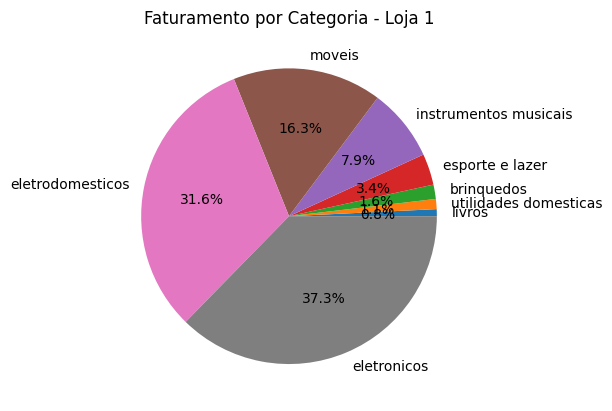

In [11]:
# Gráfico comparativo de faturamento por categoria
estabelecimento = df_categoria['Categoria do Produto']
preco = df_categoria['Preço']
fig, ax = plt.subplots()
ax.pie(preco, labels=estabelecimento, autopct='%1.1f%%')
ax.set_title('Faturamento por Categoria - Loja 1')

plt.show()

In [12]:
# Análise de vendas por categoria para Loja 2
df_categoria2 = v_categoria2.groupby(['Categoria do Produto'])['Preço'].sum().reset_index()
df_categoria2 = df_categoria2.sort_values('Preço', ascending=True)
df_categoria2


,Categoria do Produto,Preço
5,livros,13454.35
7,utilidades domesticas,19662.86
0,brinquedos,21262.21
3,esporte e lazer,46326.09
4,instrumentos musicais,139987.03
6,moveis,235234.68
1,eletrodomesticos,464758.13
2,eletronicos,547773.71


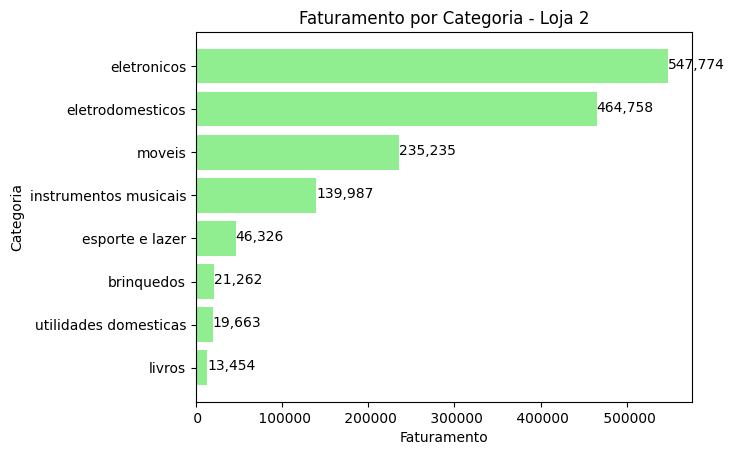

In [13]:
# Gráfico de vendas por categoria
categoria2 = df_categoria2['Categoria do Produto']
preco2 = df_categoria2['Preço']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(categoria2, preco2, color=color[1])
ax.set_ylabel('Categoria')
ax.set_xlabel('Faturamento')
ax.set_title('Faturamento por Categoria - Loja 2')
for p in ax.patches:
    width = p.get_width()
    plt.text(5+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

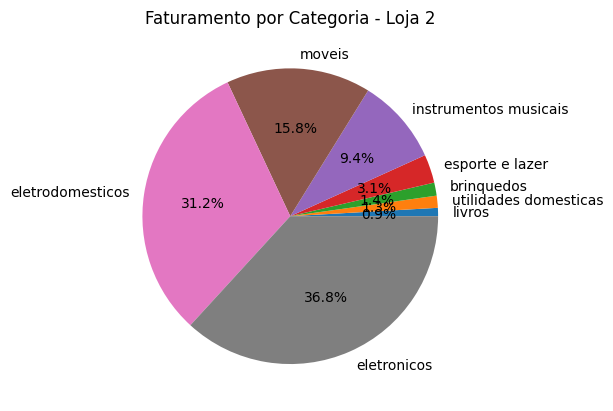

In [14]:
# Gráfico comparativo de faturamento por categoria
estabelecimento = df_categoria2['Categoria do Produto']
preco = df_categoria2['Preço']
fig, ax = plt.subplots()
ax.pie(preco, labels=estabelecimento, autopct='%1.1f%%')
ax.set_title('Faturamento por Categoria - Loja 2')

plt.show()

In [15]:
# Análise de vendas por categoria para Loja 3
df_categoria3 = v_categoria3.groupby(['Categoria do Produto'])['Preço'].sum().reset_index()
df_categoria3 = df_categoria3.sort_values('Preço', ascending=True)
df_categoria3


,Categoria do Produto,Preço
5,livros,12664.70
7,utilidades domesticas,20080.21
0,brinquedos,25869.20
3,esporte e lazer,47456.10
4,instrumentos musicais,103174.45
6,moveis,268095.56
1,eletrodomesticos,438984.89
2,eletronicos,547699.92


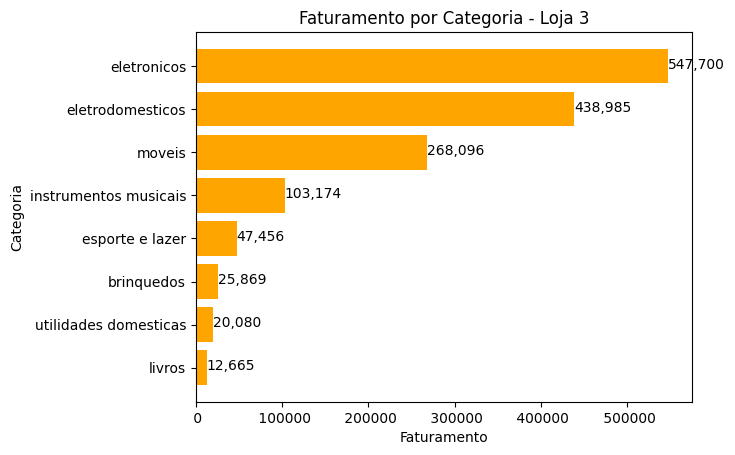

In [16]:
# Gráfico de vendas por categoria
categoria3 = df_categoria3['Categoria do Produto']
preco3 = df_categoria3['Preço']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(categoria3, preco3, color=color[2])
ax.set_ylabel('Categoria')
ax.set_xlabel('Faturamento')
ax.set_title('Faturamento por Categoria - Loja 3')
for p in ax.patches:
    width = p.get_width()
    plt.text(5+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

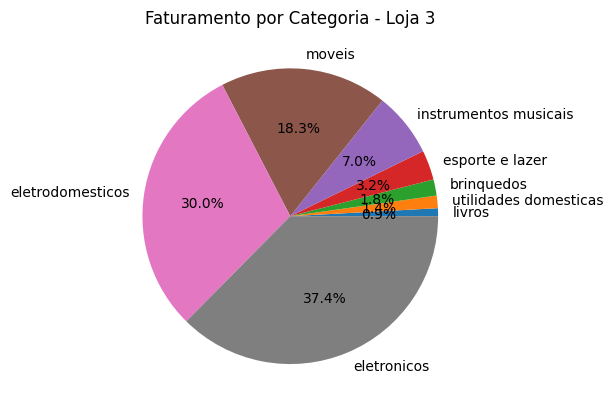

In [17]:
# Gráfico comparativo de faturamento por categoria
estabelecimento = df_categoria3['Categoria do Produto']
preco = df_categoria3['Preço']
fig, ax = plt.subplots()
ax.pie(preco, labels=estabelecimento, autopct='%1.1f%%')
ax.set_title('Faturamento por Categoria - Loja 3')

plt.show()

In [18]:
# Análise de vendas por categoria para Loja 4
df_categoria4 = v_categoria4.groupby(['Categoria do Produto'])['Preço'].sum().reset_index()
df_categoria4 = df_categoria4.sort_values('Preço', ascending=True)
df_categoria4

,Categoria do Produto,Preço
5,livros,12427.77
7,utilidades domesticas,20098.83
0,brinquedos,27015.67
3,esporte e lazer,44465.65
4,instrumentos musicais,100136.50
6,moveis,256705.65
1,eletrodomesticos,377680.65
2,eletronicos,545966.86


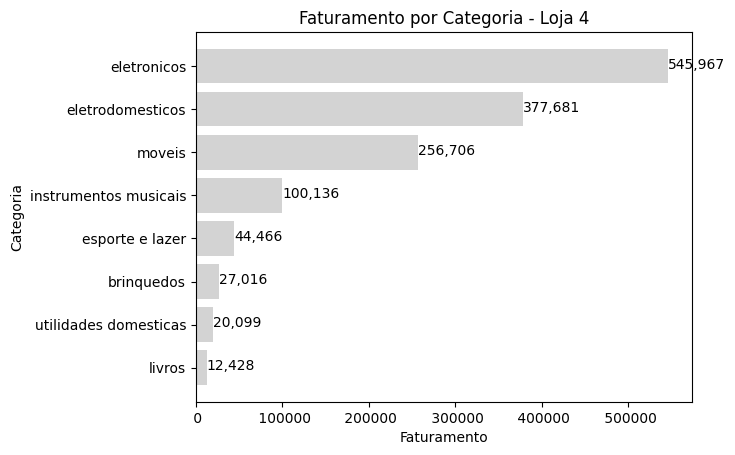

In [19]:
categoria4 = df_categoria4['Categoria do Produto']
preco4 = df_categoria4['Preço']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(categoria4, preco4, color=color[3])
ax.set_ylabel('Categoria')
ax.set_xlabel('Faturamento')
ax.set_title('Faturamento por Categoria - Loja 4')
for p in ax.patches:
    width = p.get_width()
    plt.text(5+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

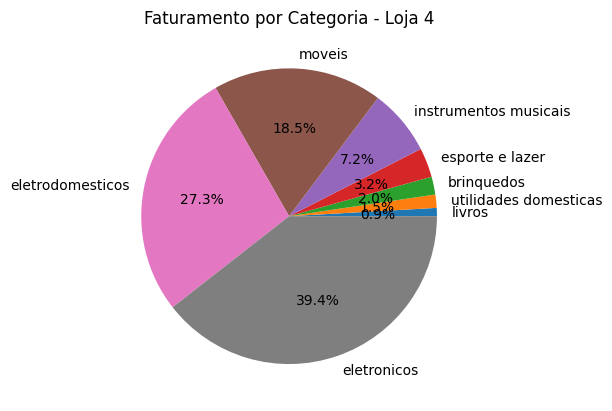

In [20]:
# Gráfico comparativo de faturamento por categoria
estabelecimento = df_categoria4['Categoria do Produto']
preco = df_categoria4['Preço']
fig, ax = plt.subplots()
ax.pie(preco, labels=estabelecimento, autopct='%1.1f%%')
ax.set_title('Faturamento por Categoria - Loja 4')

plt.show()

# 3. Média de Avaliação das Lojas

In [21]:
m_avaliacao = df_clone[['Estabelecimento', 'Avaliação da compra']]
m_avaliacao2 = df_clone2[['Estabelecimento', 'Avaliação da compra']]
m_avaliacao3 = df_clone3[['Estabelecimento', 'Avaliação da compra']]
m_avaliacao4 = df_clone4[['Estabelecimento', 'Avaliação da compra']]
m_avaliacoes = pd.concat([m_avaliacao, m_avaliacao2, m_avaliacao3, m_avaliacao4])
df_avaliacao = m_avaliacoes.groupby(['Estabelecimento'])['Avaliação da compra'].mean().reset_index()
df_avaliacao


,Estabelecimento,Avaliação da compra
0,Loja 1,3.976685
1,Loja 2,4.037304
2,Loja 3,4.048326
3,Loja 4,3.995759


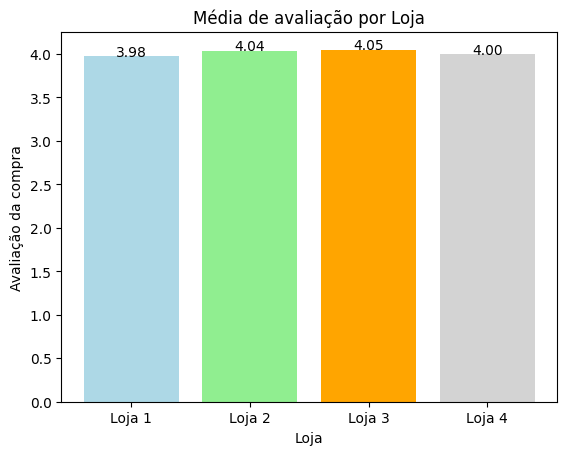

In [22]:
estabelecimento = df_avaliacao['Estabelecimento']
avaliacao = df_avaliacao['Avaliação da compra']
fig, ax = plt.subplots()
ax.bar(estabelecimento, avaliacao, color=color)
ax.set_xlabel('Loja')
ax.set_ylabel('Avaliação da compra')
ax.set_title('Média de avaliação por Loja')
for i, value in enumerate(df_avaliacao['Avaliação da compra']):
  ax.text(i, value, str("{:.2f}").format(value), ha='center')

plt.show()


In [23]:
#
# a loja 1 tem a menor avalição
#

# 4. Produtos Mais e Menos Vendidos

In [24]:
v_produto = df_clone[['Produto', 'Preço']]
v_produto2 = df_clone2[['Produto', 'Preço']]
v_produto3 = df_clone3[['Produto', 'Preço']]
v_produto4 = df_clone4[['Produto', 'Preço']]


In [25]:
# 10 produtos mais vendiddos
df_produtomais = v_produto.groupby(['Produto']).size().sort_values(ascending=True).reset_index(name='Quantidade').tail(10)
df_produtomais


,Produto,Quantidade
41,Copo térmico,54
42,Geladeira,54
43,Impressora,54
44,Bola de basquete,55
45,Blocos de montar,56
46,Cômoda,56
47,Secadora de roupas,58
48,Guarda roupas,60
49,Micro-ondas,60
50,TV Led UHD 4K,60


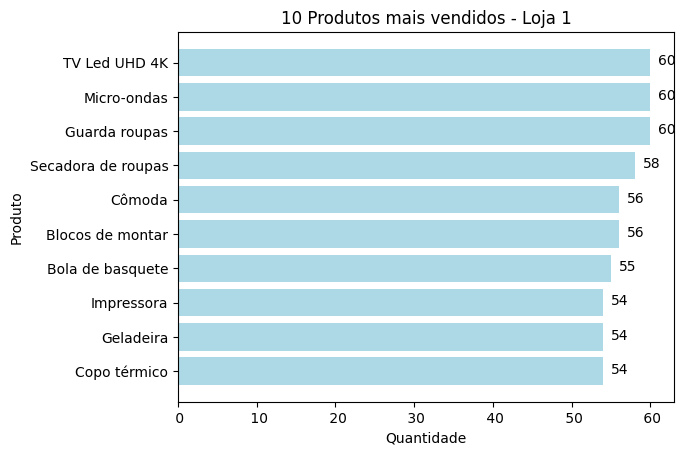

In [26]:
produto = df_produtomais['Produto']
quantidade = df_produtomais['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto, quantidade, color=color[0])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos mais vendidos - Loja 1')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()


In [27]:
df_produtomais2 = v_produto2.groupby(['Produto']).size().sort_values(ascending=True).reset_index(name='Quantidade').tail(10)
df_produtomais2


,Produto,Quantidade
41,Jogo de panelas,52
42,Blocos de montar,54
43,Guarda roupas,54
44,Celular Plus X42,55
45,Secadora de roupas,57
46,Violão,58
47,Pandeiro,58
48,Bateria,61
49,Micro-ondas,62
50,Iniciando em programação,65


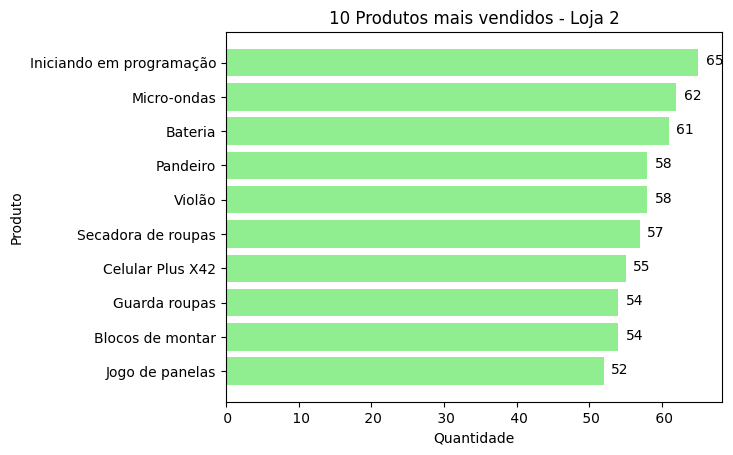

In [28]:
produto2 = df_produtomais2['Produto']
quantidade2 = df_produtomais2['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto2, quantidade2, color=color[1])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos mais vendidos - Loja 2')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

In [29]:
df_produtomais3 = v_produto3.groupby(['Produto']).size().sort_values(ascending=True).reset_index(name='Quantidade').tail(10)
df_produtomais3


,Produto,Quantidade
41,Carrinho controle remoto,52
42,Corda de pular,53
43,Fogão,53
44,Modelagem preditiva,53
45,Smart TV,54
46,Cômoda,55
47,Jogo de panelas,55
48,Cama king,56
49,Mesa de jantar,56
50,Kit banquetas,57


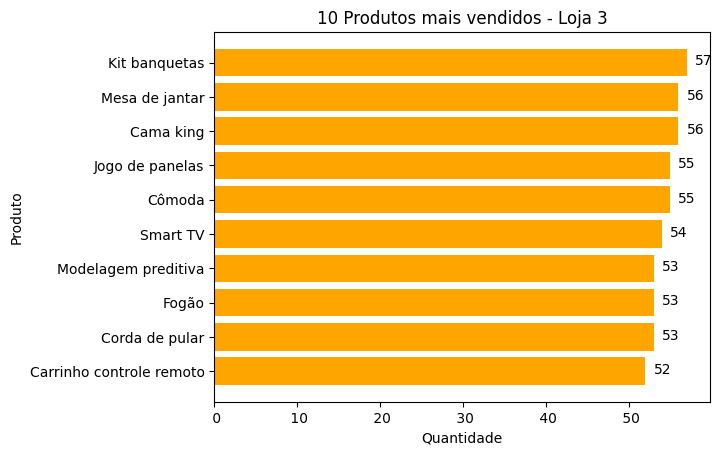

In [30]:
produto3 = df_produtomais3['Produto']
quantidade3 = df_produtomais3['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto3, quantidade3, color=color[2])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos mais vendidos - Loja 3')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

In [31]:
df_produtomais4 = v_produto4.groupby(['Produto']).size().sort_values(ascending=True).reset_index(name='Quantidade').tail(10)
df_produtomais4


,Produto,Quantidade
41,Pandeiro,52
42,Blocos de montar,54
43,Smart TV,54
44,Cômoda,55
45,Carrinho controle remoto,55
46,Mesa de jantar,55
47,Dashboards com Power BI,56
48,Cama king,56
49,Faqueiro,59
50,Cama box,62


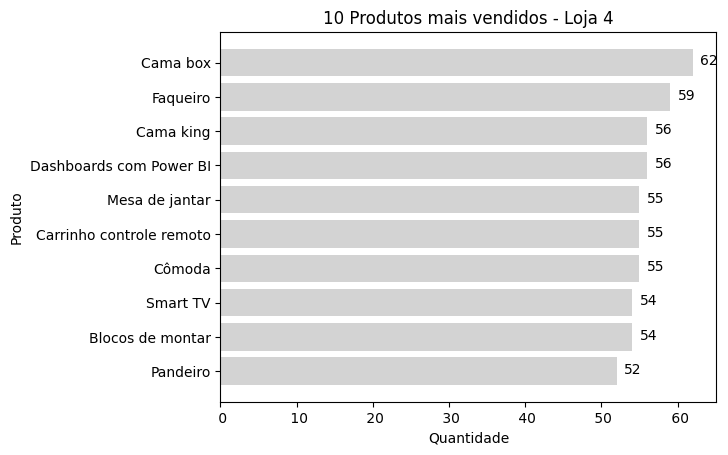

In [32]:
produto4 = df_produtomais4['Produto']
quantidade4 = df_produtomais4['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto4, quantidade4, color=color[3])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos mais vendidos - Loja 4')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

In [33]:
df_produtomenos = v_produto.groupby(['Produto']).size().sort_values(ascending=False).reset_index(name='Quantidade').tail(10)
df_produtomenos


,Produto,Quantidade
41,Corda de pular,40
42,Boneca bebê,40
43,Mesa de jantar,40
44,Dinossauro Rex,40
45,Mochila,39
46,Ciência de dados com python,39
47,Pandeiro,36
48,Panela de pressão,35
49,Celular ABXY,33
50,Headset,33


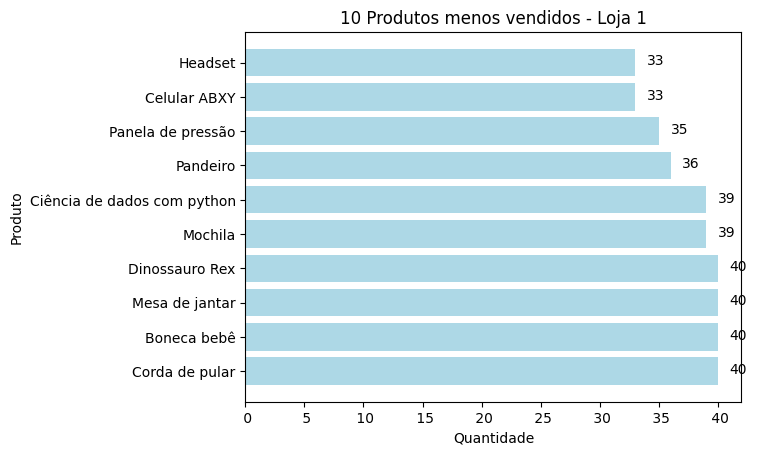

In [34]:
produto = df_produtomenos['Produto']
quantidade = df_produtomenos['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto, quantidade, color=color[0])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos menos vendidos - Loja 1')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

In [35]:
df_produtomenos2 = v_produto2.groupby(['Produto']).size().sort_values(ascending=False).reset_index(name='Quantidade').tail(10)
df_produtomenos2

,Produto,Quantidade
41,Bola de basquete,42
42,Celular ABXY,41
43,Smart TV,40
44,Faqueiro,39
45,Assistente virtual,38
46,Fone de ouvido,37
47,Poltrona,35
48,Impressora,34
49,Mesa de jantar,34
50,Jogo de tabuleiro,32


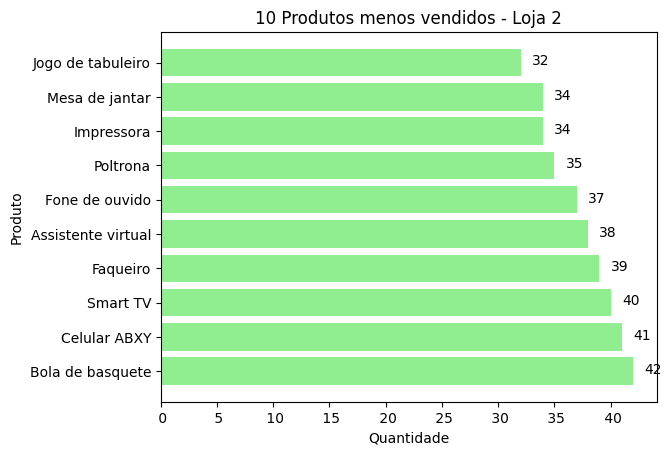

In [36]:
produto2 = df_produtomenos2['Produto']
quantidade2 = df_produtomenos2['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto2, quantidade2, color=color[1])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos menos vendidos - Loja 2')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

In [37]:
df_produtomenos3 = v_produto3.groupby(['Produto']).size().sort_values(ascending=False).reset_index(name='Quantidade').tail(10)
df_produtomenos3

,Produto,Quantidade
41,Boneca bebê,39
42,Assistente virtual,39
43,Headset,39
44,Faqueiro,39
45,Guitarra,38
46,Copo térmico,38
47,Micro-ondas,36
48,Jogo de copos,36
49,Mochila,36
50,Blocos de montar,35


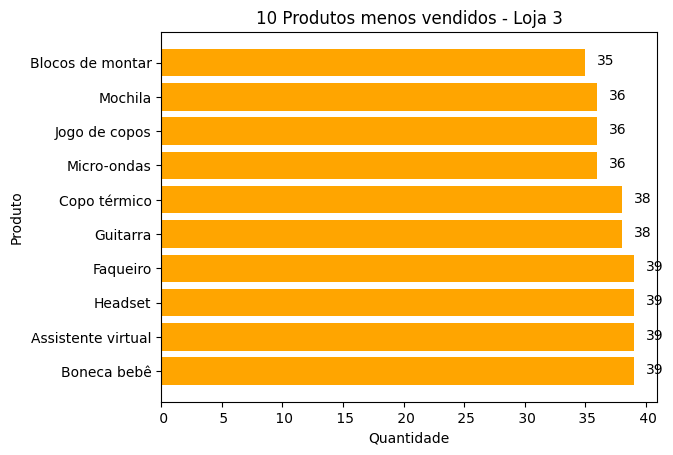

In [38]:
produto3 = df_produtomenos3['Produto']
quantidade3 = df_produtomenos3['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto3, quantidade3, color=color[2])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos menos vendidos - Loja 3')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

In [39]:
df_produtomenos4 = v_produto4.groupby(['Produto']).size().sort_values(ascending=False).reset_index(name='Quantidade').tail(10)
df_produtomenos4

,Produto,Quantidade
41,Cadeira de escritório,40
42,Celular ABXY,39
43,Xadrez de madeira,39
44,Smartwatch,39
45,Ciência de dados com python,38
46,Geladeira,38
47,Lavadora de roupas,38
48,Violão,37
49,Guarda roupas,34
50,Guitarra,33


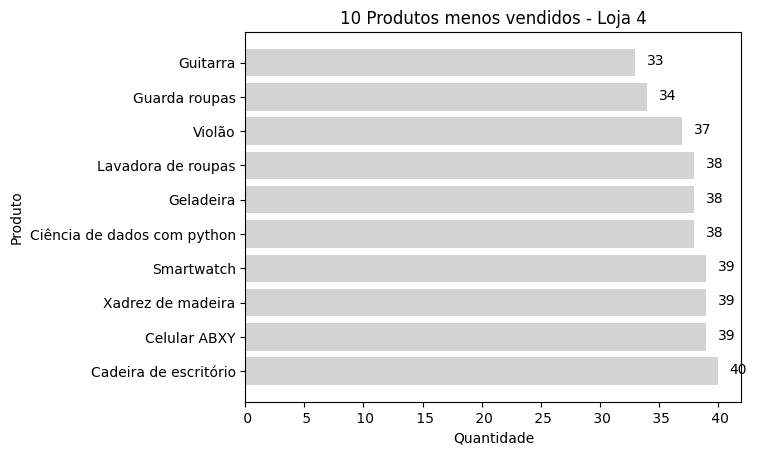

In [40]:
produto4 = df_produtomenos4['Produto']
quantidade4 = df_produtomenos4['Quantidade']
fig, ax = plt.subplots()
ax.xaxis.set_major_formatter(FormatStrFormatter('% 1.0f'))
ax.barh(produto4, quantidade4, color=color[3])
ax.set_ylabel('Produto')
ax.set_xlabel('Quantidade')
ax.set_title('10 Produtos menos vendidos - Loja 4')
for p in ax.patches:
    width = p.get_width()
    plt.text(1+p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:,.0f}'.format(width),
             ha='left', va='center')

plt.show()

# 5. Frete Médio por Loja


In [41]:
m_frete = df_clone[['Estabelecimento', 'Frete']]
m_frete2 = df_clone2[['Estabelecimento', 'Frete']]
m_frete3 = df_clone3[['Estabelecimento', 'Frete']]
m_frete4 = df_clone4[['Estabelecimento', 'Frete']]
m_fretes = pd.concat([m_frete, m_frete2, m_frete3, m_frete4])
df_frete = m_fretes.groupby(['Estabelecimento'])['Frete'].mean().reset_index()
df_frete


,Estabelecimento,Frete
0,Loja 1,34.691805
1,Loja 2,33.621941
2,Loja 3,33.074464
3,Loja 4,31.278997


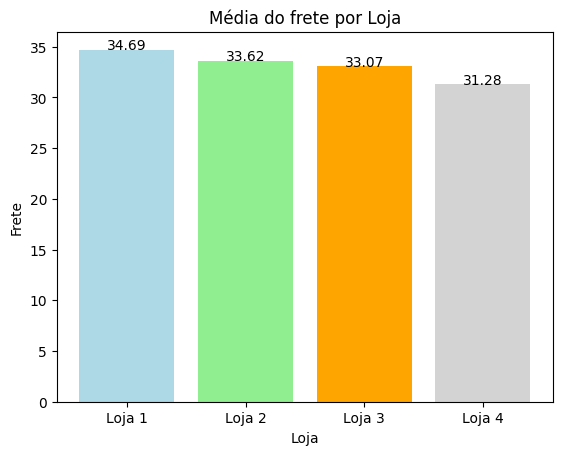

In [42]:
estabelecimento = df_frete['Estabelecimento']
fig, ax = plt.subplots()
ax.bar(estabelecimento, df_frete['Frete'], color=color)
ax.set_xlabel('Loja')
ax.set_ylabel('Frete')
ax.set_title('Média do frete por Loja')
for i, value in enumerate(df_frete['Frete']):
  ax.text(i, value, str("{:.2f}").format(value), ha='center')

plt.show()

In [43]:
#
# Pelo valor do frete, podemos verificar que a Loja 4 tem uma venda mais regionalizada.
# Enquanto as outras lojas vendem para lugares mais distantes.
#

In [44]:
latitude = df_clone['lat']
longitude = df_clone['lon']

latitude2 = df_clone2['lat']
longitude2 = df_clone2['lon']

latitude3 = df_clone3['lat']
longitude3 = df_clone3['lon']

latitude4 = df_clone4['lat']
longitude4 = df_clone4['lon']

# Crie o mapa com a localidade de seu interesse.
m =  folium.Map(location=[-22.19,-48.79], zoom_start=4)
for lat, lon in zip(latitude,longitude):
    folium.Marker(location=[lat,lon], icon=folium.Icon(color=color[0])).add_to(m)

for lat2, lon2 in zip(latitude2,longitude2):
    folium.Marker(location=[lat2,lon2], icon=folium.Icon(color=color[1])).add_to(m)

for lat3, lon3 in zip(latitude3,longitude3):
    folium.Marker(location=[lat3,lon3], icon=folium.Icon(color=color[2])).add_to(m)

for lat4, lon4 in zip(latitude4,longitude4):
    folium.Marker(location=[lat4,lon4], icon=folium.Icon(color=color[3])).add_to(m)
m

# 6. Relatório


# A Loja 4 tem um perfil mais indicado para ser vendida, pois tem o menor faturamento, uma avaliação média e as vendas devem ser mais localizadas pelo valor do frete menor.